## 2. Tree-Based Methods
## (a) Download the APS Failure data. The dataset contains a training set and a test set. the training set contains 60,000 rows, of which 1,000 belong to the positive class and 171 columns, of which one is the class column. All attributes are numeric.

In [0]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

In [0]:
#! git clone 'https://github.com/seongohr/ML.git'
filename1='https://raw.githubusercontent.com/seongohr/ML/master/aps_failure_training_set.csv'
filename2='https://raw.githubusercontent.com/seongohr/ML/master/aps_failure_test_set.csv'

train_x = pd.read_csv(filename1, index_col=None, skiprows=20, na_values=['na'])
train_x = train_x.drop(['class'], axis=1)
train_y = pd.read_csv(filename1, index_col=None, skiprows=20, usecols=[0])
test_x = pd.read_csv(filename2, index_col=None, skiprows=20, na_values=['na'])
test_x = test_x.drop(['class'], axis=1)
test_y = pd.read_csv(filename2, index_col=None, skiprows=20, usecols=[0])

columnNames = train_x.columns.tolist()

## (b) Data Preparation
## i. Research what types of techniques are usually used for dealing with data with missing values. Pick at least one of them and apply it to this data in the next steps.
### Answer : 1)replacing the missing values with mean, median, or mode 2)estimating the missing values with another predictive model(ex. KNN regression , Linear Regression), 3)iterative method based on expectation maximization

In [3]:
from sklearn.impute import SimpleImputer

print('missing value in training data before data imputation? : ', train_x.isnull().values.any()) 
print('missing value in test data before data imputation? : ', test_x.isnull().values.any())

imp_mean = SimpleImputer(missing_values=np.nan, strategy='mean')
train_x = imp_mean.fit_transform(train_x)
test_x = imp_mean.fit_transform(test_x)

train_x = pd.DataFrame(train_x, columns=columnNames)
test_x = pd.DataFrame(test_x, columns=columnNames)

temp_x = train_x.copy()
temp_x['class'] = train_y

print('missing value in training data after data imputation? : ', train_x.isnull().values.any()) 
print('missing value in test data after data imputation? : ', test_x.isnull().values.any())

missing value in training data before data imputation? :  True
missing value in test data before data imputation? :  True
missing value in training data after data imputation? :  False
missing value in test data after data imputation? :  False


In [0]:
#temp_x

## ii. For each of the 170 features, calculate the coefficient of variation CV = s/m, where s is sample standard deviation and m is sample mean.

In [0]:
cv_list = []
stds = []
means = []
total = []

sample_length = len(train_x)-1 #n-1

for col in train_x.columns:
  # sample mean
  sample_sum = train_x[col].sum()
  sample_mean = sample_sum/sample_length
  means.append(sample_mean)
  
  col_mean = train_x[col].mean()
  
  # sample stadard deviation
  sq_sample_deviation = 0
  for i in range(len(train_x)):
    sq_sample_deviation += np.square((train_x.loc[i,col] - col_mean))
  sample_std = sq_sample_deviation/sample_length
  stds.append(sample_std)
  
  cv_list.append((sample_std/sample_mean))
  
total.append(means)
total.append(stds)
total.append(cv_list)
total_df = pd.DataFrame(total, columns=columnNames)
total_df = total_df.set_index([pd.Index(['sample mean', 'sample std', 'cv'])])

In [6]:
total_df

,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,ag_004,ag_005,ag_006,ag_007,ag_008,ag_009,ah_000,ai_000,aj_000,ak_000,al_000,am_0,an_000,ao_000,ap_000,aq_000,ar_000,as_000,at_000,au_000,av_000,ax_000,ay_000,ay_001,ay_002,ay_003,ay_004,ay_005,ay_006,ay_007,...,db_000,dc_000,dd_000,de_000,df_000,dg_000,dh_000,di_000,dj_000,dk_000,dl_000,dm_000,dn_000,do_000,dp_000,dq_000,dr_000,ds_000,dt_000,du_000,dv_000,dx_000,dy_000,dz_000,ea_000,eb_000,ec_00,ed_000,ee_000,ee_001,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
sample mean,5.933749e+04,0.713200,3.560202e+08,1.906238e+05,6.819244,11.007001,2.216401e+02,9.757385e+02,8.606158e+03,8.859276e+04,4.371039e+05,1.108392e+06,1.657846e+06,4.993181e+05,3.557048e+04,5.114838e+03,1.809961e+06,9.017116e+03,1.143694e+03,9.795063e+02,5.913146e+04,9.328289e+04,3.461095e+06,3.002490e+06,1.004176e+06,4.424118e+05,0.496927,1.267386e+02,5.072131e+03,2.305842e+02,1.117845e+03,3.743336e+02,1.221185e+04,1.019029e+04,1.097518e+04,7.225904e+03,1.056618e+04,1.119810e+05,1.078569e+06,1.546058e+06,...,13.416876,2.200789e+06,3.124014e+03,3.751534e+02,2.718683e+03,5.610051e+03,4.707152e+03,3.724886e+04,3.993923e+01,1.861344e+03,2.854225e+04,7.923360e+03,3.374602e+04,2.850832e+04,6.958769e+03,4.529450e+06,2.037632e+05,8.965649e+04,1.540361e+04,4.058779e+06,5.938449e+05,7.912217e+05,7.780479e+03,0.215762,1.567776,9.717255e+06,1.353154e+03,1.452179e+03,7.334164e+05,7.838877e+05,4.454972e+05,2.111300e+05,4.457417e+05,3.939528e+05,3.330638e+05,3.462772e+05,1.387323e+05,8.389054e+03,0.090580,0.212759
sample std,2.114990e+10,2.757553,5.967065e+17,1.228163e+15,25008.899131,42179.029139,4.146775e+08,1.156595e+09,2.234400e+10,5.737453e+11,5.574171e+12,1.052556e+13,1.511236e+13,2.001621e+12,4.792502e+10,2.846199e+10,1.733207e+13,2.638017e+10,2.509513e+09,5.328729e+09,2.879094e+11,7.140334e+11,6.004016e+13,4.604929e+13,9.436502e+12,1.578181e+12,28.999628,1.199502e+08,1.415797e+10,2.470080e+08,4.172741e+07,2.106794e+06,2.042568e+11,2.833105e+11,1.814207e+11,4.215224e+10,1.243530e+11,1.923117e+12,1.063122e+13,2.578146e+13,...,4148.316290,1.300555e+13,8.678888e+07,2.723405e+06,1.760049e+10,4.059352e+10,2.929438e+11,1.689128e+11,1.917700e+07,4.139068e+09,1.120282e+12,7.187929e+10,9.365412e+09,3.581795e+09,1.859061e+08,9.071509e+15,1.781347e+12,4.137772e+10,1.090581e+09,1.277336e+14,4.141746e+12,1.644906e+13,3.350557e+09,111.780557,2735.283961,1.705250e+15,1.037331e+07,1.044740e+07,5.772569e+12,6.531598e+12,1.320339e+12,2.918940e+11,1.349692e+12,1.242686e+12,1.130319e+12,2.952782e+12,1.997995e+11,2.228241e+09,18.220338,74.441163
cv,3.564340e+05,3.866449,1.676047e+09,6.442860e+09,3667.400493,3832.018344,1.870950e+06,1.185354e+06,2.596281e+06,6.476210e+06,1.275251e+07,9.496242e+06,9.115663e+06,4.008708e+06,1.347326e+06,5.564592e+06,9.575935e+06,2.925566e+06,2.194217e+06,5.440219e+06,4.868971e+06,7.654495e+06,1.734716e+07,1.533703e+07,9.397257e+06,3.567222e+06,58.357952,9.464375e+05,2.791327e+06,1.071227e+06,3.732845e+04,5.628119e+03,1.672611e+07,2.780200e+07,1.653009e+07,5.833490e+06,1.176897e+07,1.717361e+07,9.856779e+06,1.667561e+07,...,309.186456,5.909494e+06,2.778121e+04,7.259446e+03,6.473904e+06,7.235857e+06,6.223376e+07,4.534711e+06,4.801545e+05,2.223698e+06,3.924997e+07,9.071820e+06,2.775264e+05,1.256403e+05,2.671538e+04,2.002784e+09,8.742238e+06,4.615140e+05,7.080036e+04,3.147095e+07,6.974458e+06,2.078945e+07,4.306364e+05,518.073173,1744.690724,1.754868e+08,7.666024e+03,7.194287e+03,7.870793e+06,8.332313e+06,2.963743e+06,1.382532e+06,3.027970e+06,3.154403e+06,3.393700e+06,8.527219e+06,1.440181e+06,2.656128e+05,201.150868,349.884741


## iii. Plot a correlation matrix for your feature using pandas or any other tool.



In [7]:
corr = train_x.corr()
corr.style.background_gradient(cmap='coolwarm')

/usr/local/lib/python3.6/dist-packages/matplotlib/colors.py:512: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


## iv. Pick [170^(1/2)] features with highext CV, and make scatter plots and box plots for them. Can you draw conclusions about significance of those features, just by the scatter plots?

## Answer : No, it's hard to draw conclusions about significance of those features just by the scatter plots.

In [8]:
total_df = total_df.sort_values(by='cv', axis=1, ascending=False)
total_df

,cf_000,co_000,ad_000,dq_000,ac_000,eb_000,dh_000,cs_009,dl_000,du_000,ay_001,bb_000,bu_000,bv_000,cq_000,bx_000,cc_000,dx_000,ci_000,az_005,an_000,ay_005,ay_000,ay_007,ay_002,ao_000,ay_008,cs_005,ag_004,cj_000,ay_004,az_004,ba_000,ay_006,ah_000,cs_004,bg_000,ag_005,ap_000,cn_003,...,bn_000,bo_000,cp_000,bp_000,bq_000,br_000,bs_000,dt_000,be_000,cl_000,av_000,cu_000,ct_000,ca_000,dd_000,bc_000,dp_000,bd_000,cs_000,cs_001,ec_00,de_000,ed_000,cm_000,cr_000,ax_000,af_000,bf_000,da_000,ae_000,ea_000,cg_000,dz_000,eg_000,db_000,ef_000,ar_000,ab_000,ch_000,cd_000
sample mean,1.902250e+05,1.905187e+05,1.906238e+05,4.529450e+06,3.560202e+08,9.717255e+06,4.707152e+03,7.792107e+02,2.854225e+04,4.058779e+06,1.019029e+04,4.526253e+06,4.515400e+06,4.515401e+06,4.515400e+06,4.112287e+06,3.803507e+06,7.912217e+05,3.481262e+06,2.135619e+06,3.461095e+06,1.119810e+05,1.221185e+04,1.546058e+06,1.097518e+04,3.002490e+06,1.051140e+06,2.235424e+06,4.371039e+05,1.028436e+05,1.056618e+04,1.476921e+06,1.399675e+06,1.078569e+06,1.809961e+06,4.442357e+05,1.809461e+06,1.108392e+06,1.004176e+06,5.314868e+05,...,4.637186e+05,5.131564e+05,5.704138e+02,5.513990e+05,5.828810e+05,6.048967e+05,8.036189e+04,1.540361e+04,1.372669e+03,3.430245e+02,1.117845e+03,1.222981e+03,7.491038e+02,3.916947e+04,3.124014e+03,5.695361e+02,6.958769e+03,9.217908e+02,5.479948e+03,7.884387e+02,1.353154e+03,3.751534e+02,1.452179e+03,3.431086e+02,37.063598,3.743336e+02,11.007001,74.879509,7.393914,6.819244,1.567776,91.521940,0.215762,0.212759,13.416876,0.090580,0.496927,0.713200,0.000443,1.209620e+06
sample std,1.228163e+15,1.228163e+15,1.228163e+15,9.071509e+15,5.967065e+17,1.705250e+15,2.929438e+11,3.360908e+10,1.120282e+12,1.277336e+14,2.833105e+11,1.172469e+14,1.165792e+14,1.165793e+14,1.165792e+14,1.013376e+14,8.762703e+13,1.644906e+13,6.942934e+13,4.126772e+13,6.004016e+13,1.923117e+12,2.042568e+11,2.578146e+13,1.814207e+11,4.604929e+13,1.575034e+13,3.116052e+13,5.574171e+12,1.281360e+12,1.243530e+11,1.731080e+13,1.410283e+13,1.063122e+13,1.733207e+13,4.253254e+12,1.728709e+13,1.052556e+13,9.436502e+12,4.855747e+12,...,5.748803e+10,5.634146e+10,5.768036e+07,5.516561e+10,5.413872e+10,5.357898e+10,7.055981e+09,1.090581e+09,8.199193e+07,1.862614e+07,4.172741e+07,4.485946e+07,2.402193e+07,1.252394e+09,8.678888e+07,1.562614e+07,1.859061e+08,2.229686e+07,1.051920e+08,8.238017e+06,1.037331e+07,2.723405e+06,1.044740e+07,2.395437e+06,240307.075131,2.106794e+06,42179.029139,286521.217884,27935.057667,25008.899131,2735.283961,103940.552375,111.780557,74.441163,4148.316290,18.220338,28.999628,2.757553,0.000667,0.000000e+00
cv,6.456369e+09,6.446414e+09,6.442860e+09,2.002784e+09,1.676047e+09,1.754868e+08,6.223376e+07,4.313220e+07,3.924997e+07,3.147095e+07,2.780200e+07,2.590375e+07,2.581814e+07,2.581814e+07,2.581814e+07,2.464263e+07,2.303848e+07,2.078945e+07,1.994373e+07,1.932353e+07,1.734716e+07,1.717361e+07,1.672611e+07,1.667561e+07,1.653009e+07,1.533703e+07,1.498405e+07,1.393942e+07,1.275251e+07,1.245931e+07,1.176897e+07,1.172087e+07,1.007579e+07,9.856779e+06,9.575935e+06,9.574318e+06,9.553725e+06,9.496242e+06,9.397257e+06,9.136157e+06,...,1.239718e+05,1.097939e+05,1.011202e+05,1.000466e+05,9.288124e+04,8.857542e+04,8.780258e+04,7.080036e+04,5.973176e+04,5.429974e+04,3.732845e+04,3.668041e+04,3.206756e+04,3.197374e+04,2.778121e+04,2.743661e+04,2.671538e+04,2.418863e+04,1.919580e+04,1.044852e+04,7.666024e+03,7.259446e+03,7.194287e+03,6.981572e+03,6483.641354,5.628119e+03,3832.018344,3826.430251,3778.114851,3667.400493,1744.690724,1135.690003,518.073173,349.884741,309.186456,201.150868,58.357952,3.866449,1.504300,0.000000e+00


In [9]:
#train_y

,class
0,neg
1,neg
2,neg
3,neg
4,neg
5,neg
6,neg
7,neg
8,neg
9,pos


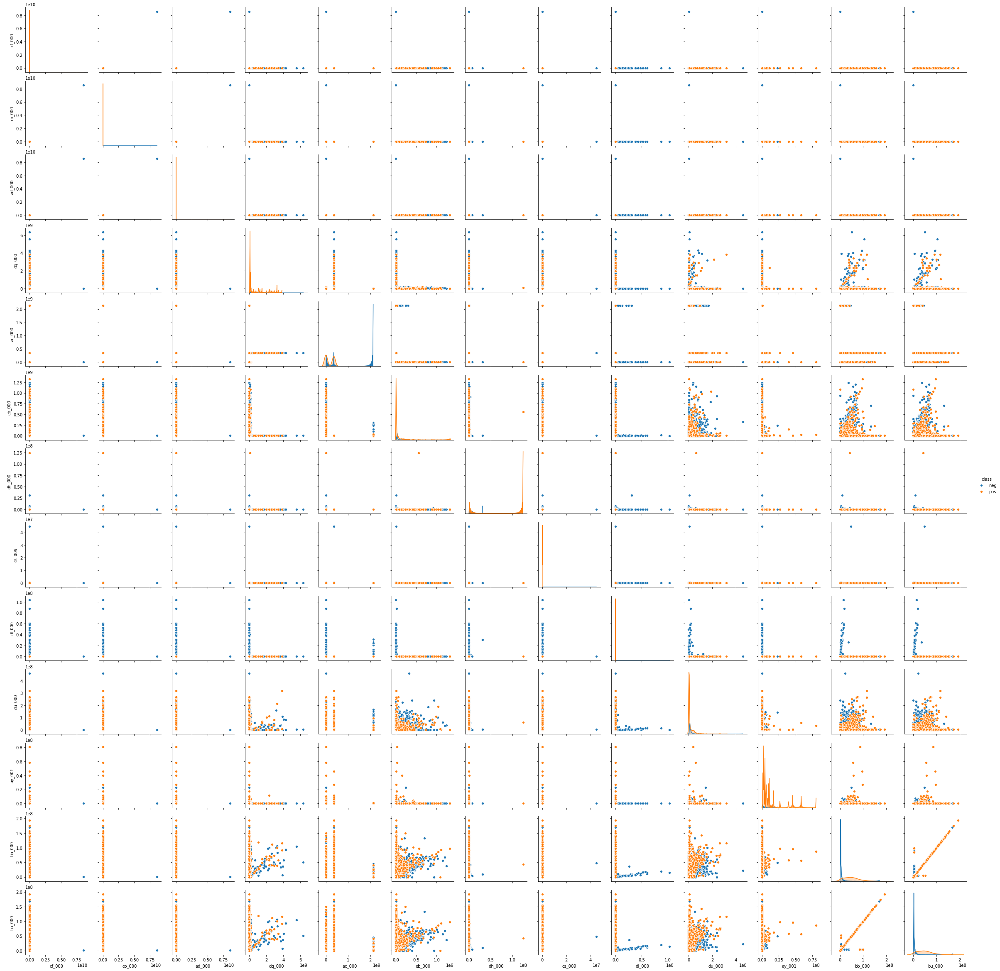

In [10]:
import math
num_vars = total_df.columns[0:int(math.sqrt(170))].tolist()
sc_plot = sns.pairplot(temp_x, vars=num_vars, hue='class')

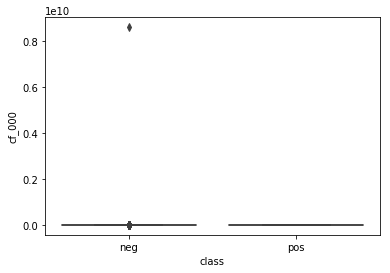

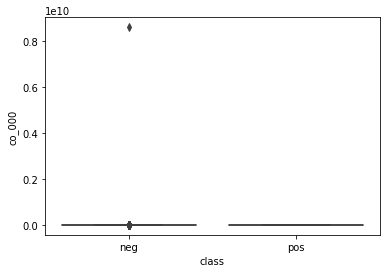

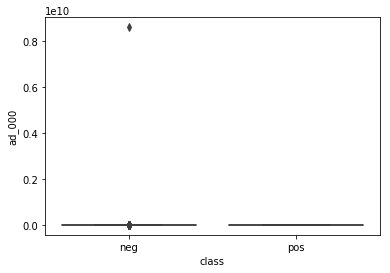

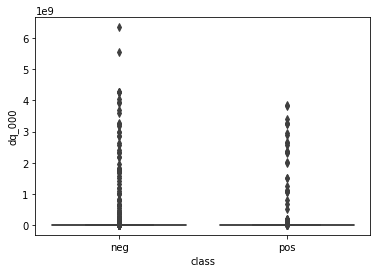

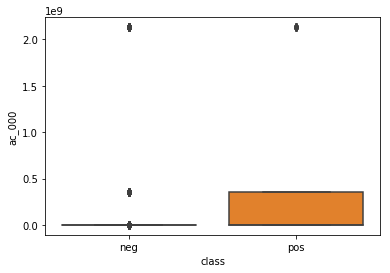

...

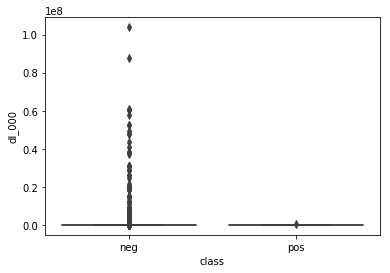

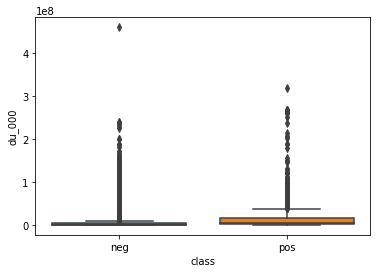

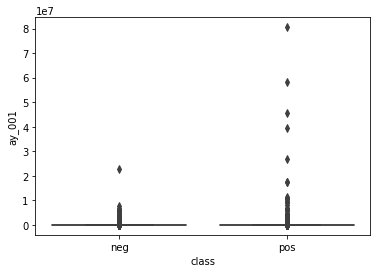

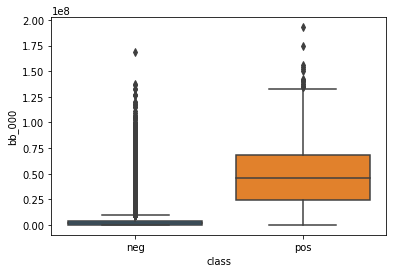

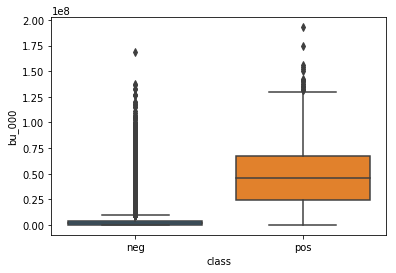

In [11]:
for i in range(len(num_vars)):
    col = num_vars[i]
    bPlot = sns.boxplot(x = 'class', y = col, data = temp_x)
    plt.show()

## v. Determine the number of positive and negative data. Is this data set imbalanced?
### Answer : Yes, data set is imbalanced. In training set, positive class points are about 2% and the negative class points are 98%.

In [12]:
train_pos = sum(train_y['class']=='pos')
train_neg = sum(train_y['class']=='neg')

print('training set \npositive : ', train_pos/(train_pos+train_neg), '\nnegative :', train_neg/(train_pos+train_neg))

test_pos = sum(test_y['class']=='pos')
test_neg = sum(train_y['class']=='neg')
print('test set \npositive : ', test_pos/(test_pos+test_neg), '\nnegative :', test_neg/(test_pos+test_neg))


total_pos = train_pos + test_pos
total_neg = train_neg + test_neg
print('total set \npositive : ', total_pos/(total_pos+total_neg), '\nnegative :', total_neg/(total_pos+total_neg))


training set 
positive :  0.016666666666666666 
negative : 0.9833333333333333
test set 
positive :  0.00631578947368421 
negative : 0.9936842105263158
total set 
positive :  0.011518324607329843 
negative : 0.9884816753926702


## (c) Train a random forest to classify the data set. Do NOT compensate for class imbalance in the data set. Calculate the confusion matrix, ROC, AUC, and misclassification for training and test sets and report them (You may use pROC package). Calculate Out of Bag error estimate for your random forest and compare it to the test error.

In [0]:
classes = {'neg': 0,'pos': 1} 
train_y['class'] = [classes[item] for item in train_y['class']]
test_y['class'] = [classes[item] for item in test_y['class']]

#print(train_y)
#print(test_y)

/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


out-of-bag error :  0.00873333333333337
AUC: 1.000


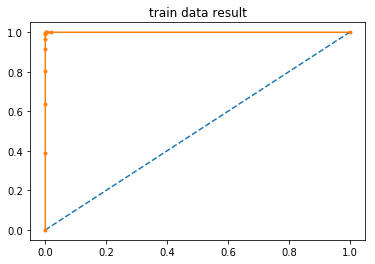

In [14]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score



#train model
rfc = RandomForestClassifier(random_state=0, oob_score=True).fit(train_x, train_y)
oobError = 1-rfc.oob_score_

#train data prediction
train_pred = rfc.predict(train_x)

#train data
#confusion matrix
train_cm = confusion_matrix(train_y, train_pred)
train_prob = rfc.predict_proba(train_x)
train_prob = train_prob[:,1]
#auc,roc
train_auc = roc_auc_score(train_y, train_prob)
train_fpr, train_tpr, train_thresholds = roc_curve(train_y, train_prob)

print('out-of-bag error : ', oobError)
print('AUC: %.3f' % train_auc)
plt.title('train data result')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(train_fpr, train_tpr, marker='.')
plt.show()





test error :  0.0088125
AUC: 0.971


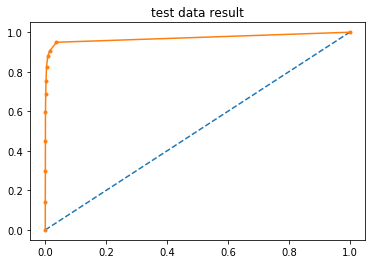

In [15]:
#test data
test_pred = rfc.predict(test_x)
test_error = mean_squared_error(test_y, test_pred)
#confusion matrix
test_cm = confusion_matrix(test_y, test_pred)
test_prob = rfc.predict_proba(test_x)
test_prob = test_prob[:,1]
#auc,roc
test_auc = roc_auc_score(test_y, test_prob)
test_fpr, test_tpr, test_thresholds = roc_curve(test_y, test_prob)

print('test error : ', test_error)
print('AUC: %.3f' % test_auc)
plt.title('test data result')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(test_fpr, test_tpr, marker='.')
plt.show()

In [16]:
test_x

,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,ag_004,ag_005,ag_006,ag_007,ag_008,ag_009,ah_000,ai_000,aj_000,ak_000,al_000,am_0,an_000,ao_000,ap_000,aq_000,ar_000,as_000,at_000,au_000,av_000,ax_000,ay_000,ay_001,ay_002,ay_003,ay_004,ay_005,ay_006,ay_007,...,db_000,dc_000,dd_000,de_000,df_000,dg_000,dh_000,di_000,dj_000,dk_000,dl_000,dm_000,dn_000,do_000,dp_000,dq_000,dr_000,ds_000,dt_000,du_000,dv_000,dx_000,dy_000,dz_000,ea_000,eb_000,ec_00,ed_000,ee_000,ee_001,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,60.0,0.000000,2.000000e+01,12.000000,0.000000,0.00000,0.000000,0.000000,0.000000,2.682000e+03,4.736000e+03,3.862000e+03,1.846000e+03,0.000000e+00,0.000000,0.000000,3976.0,0.0,0.0,0.000000,1520.0,2374.0,11516.0,9480.0,111258.0,470.0,0.000000,0.0,0.0,0.0,58.000000,26.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000,6.598000e+03,70.000000,112.000000,0.00000,0.000000,0.00000,0.000000e+00,0.000000,0.000000,0.0000,0.000000,340.0,0.000000,0.000000,1.100000e+03,5.740000e+02,232.00000,66.000000,7.800000e+02,8.820000e+02,0.000000e+00,4.000000,0.000000,0.000000,0.000000e+00,465.500000,90.0000,7.502000e+03,3.156000e+03,1.098000e+03,1.380000e+02,4.120000e+02,6.540000e+02,7.800000e+01,8.800000e+01,0.000000e+00,0.000000,0.000000,0.000000
1,82.0,0.000000,6.800000e+01,40.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000e+00,7.480000e+02,1.259400e+04,3.636000e+03,0.000000e+00,0.000000,0.000000,5244.0,0.0,60.0,0.000000,0.0,0.0,23174.0,18166.0,23686.0,1270.0,0.000000,0.0,0.0,0.0,12.000000,82.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000e+00,0.000000e+00,6.920000e+02,...,0.000000,7.918000e+03,78.000000,40.000000,0.00000,0.000000,0.00000,0.000000e+00,0.000000,0.000000,0.0000,0.000000,352.0,0.000000,0.000000,3.996000e+03,5.840000e+02,200.00000,62.000000,3.758000e+04,3.756000e+03,6.368000e+03,36.000000,0.000000,0.000000,0.000000e+00,2.860000,102.0000,1.004000e+04,3.310000e+03,1.068000e+03,2.760000e+02,1.620000e+03,1.160000e+02,8.600000e+01,4.620000e+02,0.000000e+00,0.000000,0.000000,0.000000
2,66002.0,2.000000,2.120000e+02,112.000000,0.000000,0.00000,0.000000,0.000000,0.000000,1.994860e+05,1.358536e+06,1.952422e+06,4.527060e+05,2.513000e+04,520.000000,0.000000,1891670.0,0.0,0.0,0.000000,77898.0,110548.0,3605894.0,3291610.0,959756.0,286536.0,0.000000,0.0,0.0,0.0,106.000000,340.000000,0.000000,0.000000,0.000000,0.000000,0.00000,2.428600e+04,6.812600e+05,2.808472e+06,...,0.000000,3.613906e+06,4218.000000,692.000000,0.00000,0.000000,0.00000,0.000000e+00,0.000000,0.000000,0.0000,0.000000,25278.0,9438.000000,2504.000000,1.026271e+07,1.278664e+06,109700.00000,19072.000000,9.520000e+03,4.902000e+03,4.434614e+06,70900.000000,0.000000,0.000000,2.600288e+07,2057.840000,2158.0000,3.963120e+05,5.381360e+05,4.950760e+05,3.803680e+05,4.401340e+05,2.695560e+05,1.315022e+06,1.536800e+05,5.160000e+02,0.000000,0.000000,0.000000
3,59816.0,0.772065,1.010000e+03,936.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000e+00,1.239220e+05,9.843140e+05,1.680050e+06,1.135268e+06,92606.000000,14038.000000,1772828.0,0.0,0.0,0.000000,1116.0,2372.0,3546760.0,3053176.0,652616.0,423374.0,0.000000,0.0,7274.0,0.0,1622.000000,432.000000,0.000000,0.000000,0.000000,0.000000,0.00000,6.388000e+03,1.091104e+06,2.930694e+06,...,46.000000,3.413978e+06,2924.000000,414.000000,0.00000,0.000000,60.00000,3.871000e+04,0.000000,0.000000,0.0000,0.000000,27740.0,33354.000000,6330.000000,0.000000e+00,0.000000e+00,133542.00000,21290.000000,2.718360e+06,4.353700e+05,0.000000e+00,0.000000,0.000000,0.000000,1.179900e+06,1541.320000,1678.0000,6.595500e+05,6.915800e+05,5.408200e+05,2.432700e+05,4.833020e+05,4.853320e+05,4.313760e+05,2.100740e+05,2.816620e+05,3232.000000,0.000000,0.000000
4,1814.0,0.772065,1.560000e+02,140.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000e+00,7.200000e+01,1.792600e+04,8.283400e+04,3.114000e+03,0.000000,0.000000,48978.0,0.0,0.0,0.0

In [17]:
print('out-of-bag error : ', oobError)
print('test error : ', test_error)


out-of-bag error :  0.00873333333333337
test error :  0.0088125


## Answer : There isn't much difference between out-of-error and test error. It's almost same. So I think out-of-bag error can be used for estimation of test error.

## (d) Research how class imbalance is addressed in random forest. Compensate for class imbalance in your random forest and repeat 2c. Compare the results with those of 2c.

/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


out-of-bag error :  0.010483333333333289
AUC: 1.000


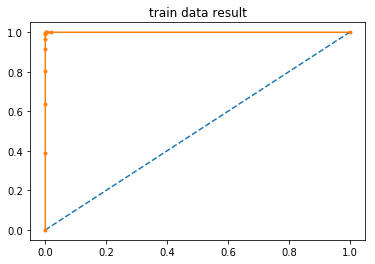

test error :  0.0133125
AUC: 0.971


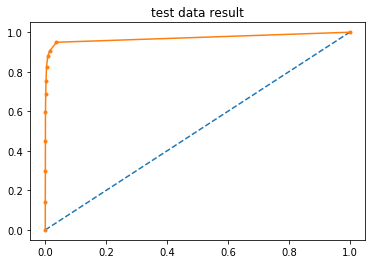

In [18]:
#train model
rfc_bal = RandomForestClassifier(random_state=0, oob_score=True, class_weight="balanced").fit(train_x, train_y)
oobError_bal = 1-rfc_bal.oob_score_

#train data prediction
train_pred_bal = rfc_bal.predict(train_x)

#train data
#confusion matrix
train_cm_bal = confusion_matrix(train_y, train_pred)
train_prob_bal = rfc_bal.predict_proba(train_x)
train_prob_bal = train_prob_bal[:,1]
#auc,roc
train_auc_bal = roc_auc_score(train_y, train_prob)
train_fpr_bal, train_tpr_bal, train_thresholds_bal = roc_curve(train_y, train_prob)

plt.title('train data result')
print('out-of-bag error : ', oobError_bal)
print('AUC: %.3f' % train_auc_bal)
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(train_fpr_bal, train_tpr_bal, marker='.')
plt.show()

#test data
test_pred = rfc_bal.predict(test_x)
test_error_bal = mean_squared_error(test_y, test_pred)
#confusion matrix
test_cm_bal = confusion_matrix(test_y, test_pred)
test_prob_bal = rfc.predict_proba(test_x)
test_prob_bal = test_prob_bal[:,1]
#auc,roc
test_auc_bal = roc_auc_score(test_y, test_prob)
test_fpr_bal, test_tpr_bal, test_thresholds_bal = roc_curve(test_y, test_prob)

plt.title('test data result')
print('test error : ', test_error_bal)
print('AUC: %.3f' % test_auc_bal)
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(test_fpr_bal, test_tpr_bal, marker='.')
plt.show()

In [19]:
print('Not compensated')
print('out-of-bag error : ', oobError)
print('test error : ', test_error)

print('\nCompensated')
print('out-of-bag error : ', oobError_bal)
print('test error : ', test_error_bal)

Not compensated
out-of-bag error :  0.00873333333333337
test error :  0.0088125

Compensated
out-of-bag error :  0.010483333333333289
test error :  0.0133125
